In [3]:
import tensorflow as tf
print(tf.__version__)

2.6.0


# GPU 사용가능 확인

In [1]:
from tensorflow.python.client import device_lib
device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 3549620127604999366,
 name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 2911292622
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 18064266954734716158
 physical_device_desc: "device: 0, name: NVIDIA GeForce GTX 1050 Ti, pci bus id: 0000:01:00.0, compute capability: 6.1"]

In [4]:
tf.test.is_gpu_available()

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


True

# 이미지 LIBRARY

In [5]:
import cv2

import os
from glob import glob

import tensorflow as tf
from PIL import Image

import numpy as np
from matplotlib import pyplot as plt
cv2.__version__

'4.5.3'

# 이미지 파일 불러오기

In [6]:
os.getcwd()

'C:\\Users\\hyunj\\OneDrive\\바탕 화면\\Codings\\0.실습\\콘크리트이미지'

In [34]:
data_paths = glob('../../../scope/210909/X6400/40B/*.png')
data_paths

['../../../scope/210909/X6400/40B\\0001.png',
 '../../../scope/210909/X6400/40B\\0002.png',
 '../../../scope/210909/X6400/40B\\0003.png',
 '../../../scope/210909/X6400/40B\\0004.png',
 '../../../scope/210909/X6400/40B\\0005.png',
 '../../../scope/210909/X6400/40B\\0006.png',
 '../../../scope/210909/X6400/40B\\0007.png',
 '../../../scope/210909/X6400/40B\\0008.png',
 '../../../scope/210909/X6400/40B\\0009.png',
 '../../../scope/210909/X6400/40B\\0010.png',
 '../../../scope/210909/X6400/40B\\0011.png',
 '../../../scope/210909/X6400/40B\\0012.png',
 '../../../scope/210909/X6400/40B\\0013.png',
 '../../../scope/210909/X6400/40B\\0014.png',
 '../../../scope/210909/X6400/40B\\0015.png',
 '../../../scope/210909/X6400/40B\\0016.png',
 '../../../scope/210909/X6400/40B\\0017.png',
 '../../../scope/210909/X6400/40B\\0018.png',
 '../../../scope/210909/X6400/40B\\0019.png',
 '../../../scope/210909/X6400/40B\\0020.png',
 '../../../scope/210909/X6400/40B\\0021.png',
 '../../../scope/210909/X6400/40B\

In [41]:
path = data_paths[0]
path

'../../../scope/210909/X6400/40B\\0001.png'

In [42]:
len(data_paths)

200

# 이미지파일 열기(tf.io)

In [43]:
path

'../../../scope/210909/X6400/40B\\0001.png'

In [44]:
gfile = tf.io.read_file(path)
image = tf.io.decode_image(gfile)

In [45]:
image.shape

TensorShape([3000, 4000, 3])

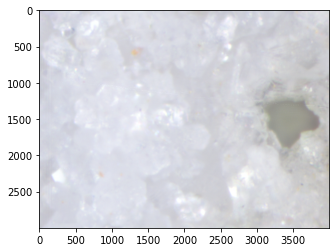

In [46]:
plt.imshow(image[:,:,:])
plt.show()

# 이미지파일 열기(pil)

In [47]:
image_pil = Image.open(path).convert('L')
image = np.array(image_pil)

In [48]:
image.shape

(3000, 4000)

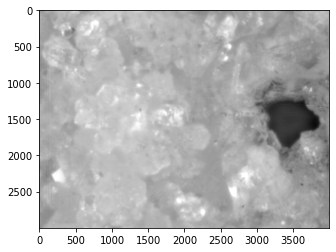

In [49]:
plt.imshow(image,'gray')
plt.show()

# 이미지 히스토그램

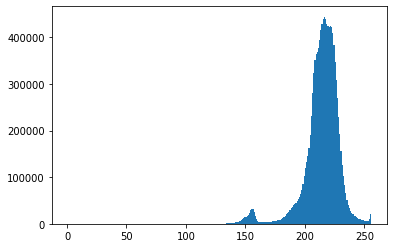

In [50]:
import cv2

plt.hist(image.ravel(), 256, [0,256])
plt.show()

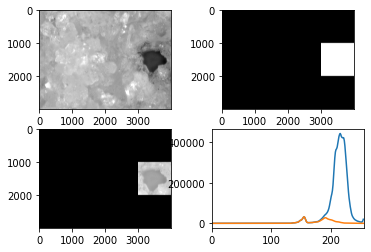

In [51]:
# 원하는 영역만 히스토그램
mask = np.zeros(image.shape[:2], np.uint8)
mask[1000:2000, 3000:4000] = 255
masked_img = cv2.bitwise_and(image, image, mask=mask)

hist_full = cv2.calcHist([image], [0], None, [256], [0,256])
hist_mask = cv2.calcHist([image], [0], mask, [256], [0,256])

plt.subplot(221), plt.imshow(image, 'gray')
plt.subplot(222), plt.imshow(mask,'gray')
plt.subplot(223), plt.imshow(masked_img, 'gray')
plt.subplot(224), plt.plot(hist_full), plt.plot(hist_mask)
plt.xlim([0,256])
plt.show()

# 이미지 이분화

### 히스토그램

(<AxesSubplot:title={'center':'Histogram'}>,
 Text(0.5, 1.0, 'Histogram'))

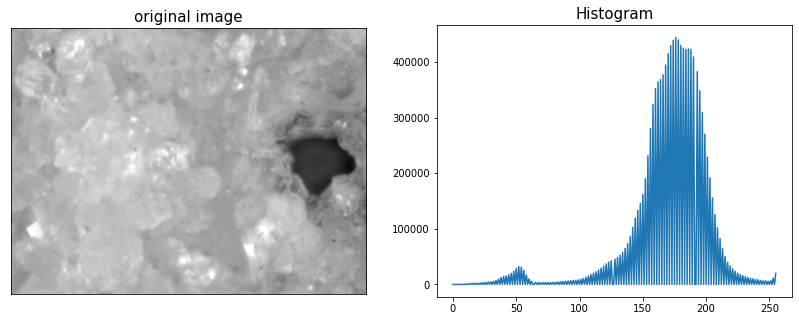

In [52]:
hist, bin_edges = np.histogram(image, bins=256)

plt.figure(figsize=(14,5))
plt.subplot(121),plt.imshow(image, cmap='gray'),plt.title('original image',fontsize=15)
plt.xticks([]), plt.yticks([])

plt.subplot(122),plt.plot(hist),plt.title('Histogram',fontsize=15)

### otsu (각 분산을 최대화시키는 기준점 찾기)

Otsu's algorithm implementation thresholding result:  196.18359375


(Text(0.5, 0, 'pixel values'), Text(0, 0.5, 'variance'))

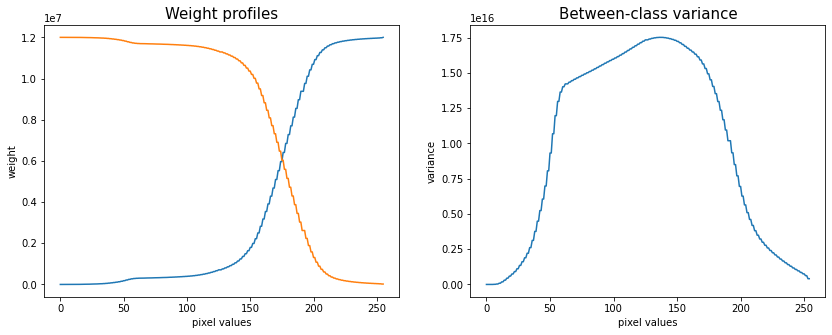

In [53]:
weight1 = np.cumsum(hist)
weight2 = np.cumsum(hist[::-1])[::-1]

bin_mids = (bin_edges[:-1] + bin_edges[1:]) / 2.

mean1 = np.cumsum(hist * bin_mids) / weight1
mean2 = (np.cumsum((hist * bin_mids)[::-1]) / weight2[::-1])[::-1]

inter_class_variance = weight1[:-1] * weight2[1:] * (mean1[:-1] - mean2[1:]) ** 2
index_of_max_val = np.argmax(inter_class_variance)

threshold = bin_mids[:-1][index_of_max_val]

print("Otsu's algorithm implementation thresholding result: ", threshold)


# Plotting weight and between-class variance
plt.figure(figsize=(14,5))
plt.subplot(121)
plt.plot(weight1)
plt.plot(weight2)
plt.title('Weight profiles',fontsize=15)
plt.xlabel('pixel values'), plt.ylabel('weight')

plt.subplot(122)
plt.plot(inter_class_variance)
plt.title('Between-class variance',fontsize=15)
plt.xlabel('pixel values'), plt.ylabel('variance')

### otsu threshold

In [54]:
otsu_threshold, image_result = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
print(otsu_threshold)

197.0


(([], []), ([], []))

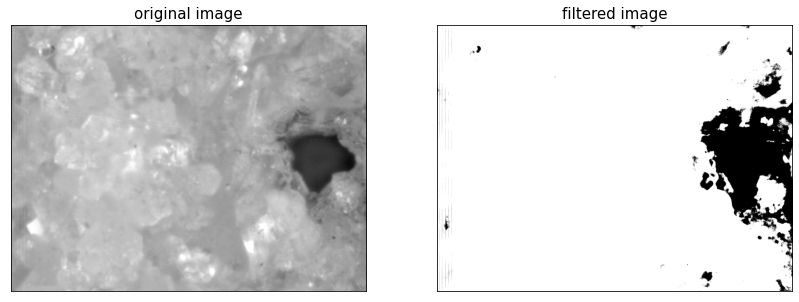

In [55]:
maxValue = 255
th, dst = cv2.threshold(image, otsu_threshold, maxValue, cv2.THRESH_BINARY)

plt.figure(figsize=(14,5))
plt.subplot(121),plt.imshow(image, cmap='gray'),plt.title('original image',fontsize=15)
plt.xticks([]), plt.yticks([])

plt.subplot(122),plt.imshow(dst,cmap='gray'),plt.title('filtered image',fontsize=15)
plt.xticks([]), plt.yticks([])

### 적응 임계처리
- **cv2.adaptiveThreshold(src, maxValue, adaptiveMethod, thresholdType, blockSize, C)**
    - Parameters:	
        - src – grayscale image
        - maxValue – 임계값
        - adaptiveMethod – thresholding value를 결정하는 계산 방법
        - thresholdType – threshold type
        - blockSize – thresholding을 적용할 영역 사이즈
        - C – 평균이나 가중평균에서 차감할 값
    - Adaptive Method
        - cv2.ADAPTIVE_THRESH_MEAN_C : 주변영역의 평균값으로 결정
        - cv2.ADAPTIVE_THRESH_GAUSSIAN_C :

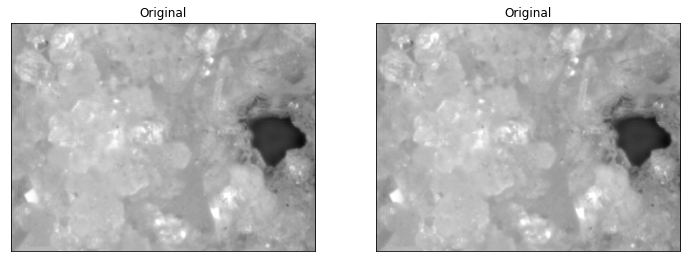

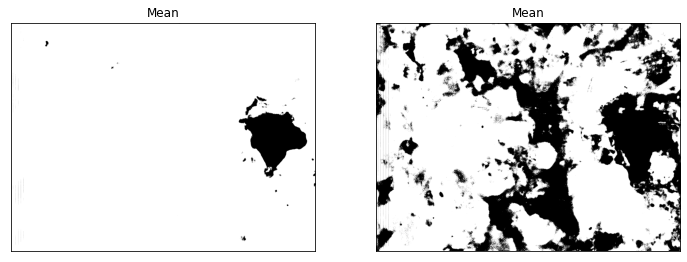

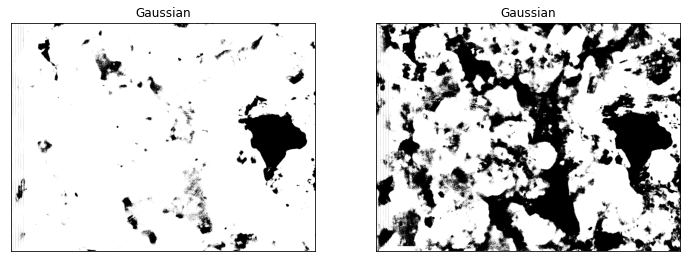

In [56]:
th1 = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 2001, 20)
th2 = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 2001, 10)

th3 = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 2001, 2)
th4 = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 2001, 2)

titles = ['Original',"Mean", 'Gaussian']

images1 = [image, th1, th2]
images2 = [image, th3, th4]

for i in range(3):
    plt.figure(figsize=(12,15))
    plt.subplot(3, 2, 2*i+1)
    plt.imshow(images1[i],'gray')
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])
    
    plt.subplot(3, 2, 2*i+2)
    plt.imshow(images2[i],'gray')
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])
    
    
plt.show()

# 에지 검출
- 로버츠
- 프리윗
- 소벨

In [26]:
roberts_x = np.array([[-1, 0, 0], [0, 1, 0], [0, 0, 0]])
roberts_y = np.array([[0, 0, -1], [0, 1, 0], [0, 0, 0]])

prewitt_x = np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]])
prewitt_y = np.array([[1, 0, -1], [1, 0, -1], [1, 0, -1]])

sobel_x = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
sobel_y = np.array([[1, 0, -1], [2, 0, -2], [1, 0, -1]])

In [27]:
roberts_x = cv2.convertScaleAbs(cv2.filter2D(image, -1, roberts_x))
roberts_y = cv2.convertScaleAbs(cv2.filter2D(image, -1, roberts_y))

prewitt_x = cv2.convertScaleAbs(cv2.filter2D(image, -1, prewitt_x))
prewitt_y = cv2.convertScaleAbs(cv2.filter2D(image, -1, prewitt_y))

sobel_x = cv2.convertScaleAbs(cv2.filter2D(image, -1, sobel_x))
sobel_y = cv2.convertScaleAbs(cv2.filter2D(image, -1, sobel_y))

In [28]:
prewitt = cv2.addWeighted(prewitt_x, 1, prewitt_y, 1, 0)

roberts = cv2.addWeighted(roberts_x, 1, roberts_y, 1, 0)

sobel = cv2.addWeighted(sobel_x, 1, sobel_y, 1, 0)

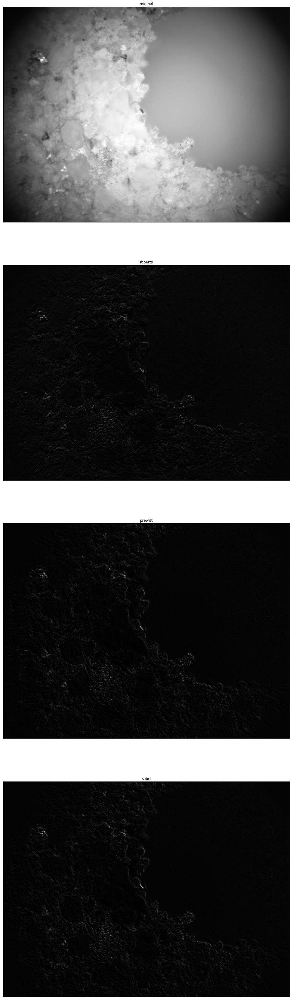

In [29]:
titles = ['original', 'roberts', 'prewitt', 'sobel']
images = [image, roberts, prewitt, sobel]

plt.figure(figsize=(48,60))
for i in range(4):
    plt.subplot(4, 1, i+1)
    plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])

### 케니 에지

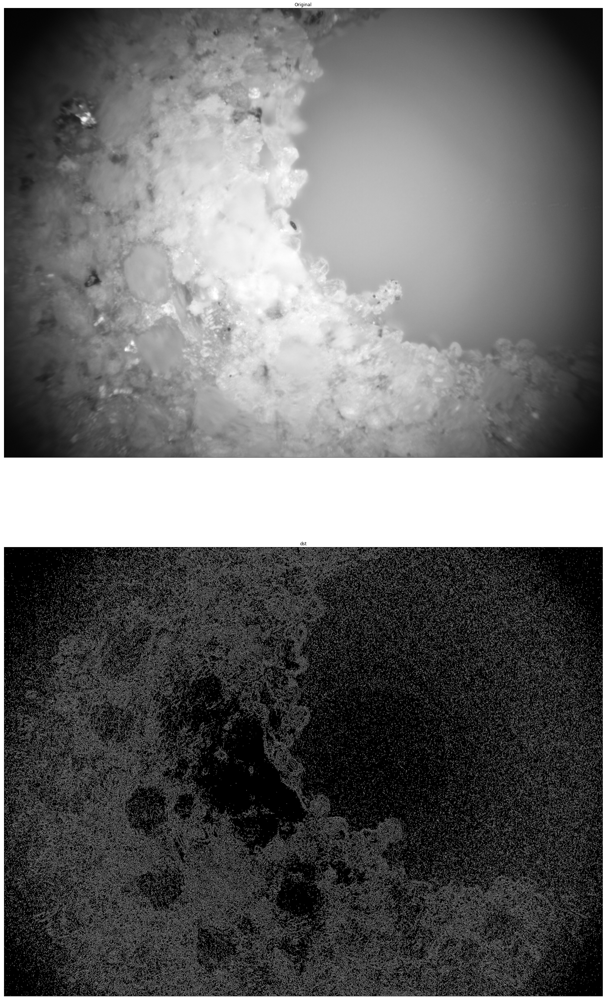

In [30]:
if image is None:
    print('Image load failed!')
    sys.exit()

dst = cv2.Canny(image, 8, 15) # 하단 임계값과 상단 임계값은 실험적으로 결정하기

plt.figure(figsize=(40,50))
plt.subplot(2,1,1)
plt.imshow(image, 'gray')
plt.title('Original')
plt.xticks([])
plt.yticks([])

plt.subplot(212)
plt.imshow(dst, 'gray')
plt.title('dst')
plt.xticks([])
plt.yticks([])

plt.show()

In [31]:
th1

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [32]:
cnt = 0
tot = 0
for i in th1:
    for j in i:
        tot += 1
        if j == 0:
            cnt += 1
            
print(cnt/tot)

0.10805516666666666


In [33]:
cnt = 0
tot = 0
for i in th3:
    for j in i:
        tot += 1
        if j == 0:
            cnt += 1
            
print(cnt/tot)

0.31084608333333336
